<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Datenimport-und--aufbereitung" data-toc-modified-id="Datenimport-und--aufbereitung-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Datenimport und -aufbereitung</a></span></li><li><span><a href="#Auswertungen" data-toc-modified-id="Auswertungen-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Auswertungen</a></span></li></ul></div>

## Datenimport und -aufbereitung

In [250]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
%matplotlib inline
import config

# Zum Generieren der Karte
import osmnx as ox
from cartes.osm import Nominatim

# Zum Hochladen der Karte. 
import boto3
from botocore.exceptions import ClientError

# Berechnen der Streckenlänge
from pyproj import Proj, Transformer
import shapely.ops as sp_ops

# Export von Grafiken auf Datawrapper. 
from datawrapper import Datawrapper
dw = Datawrapper(access_token = config.dw_token)

In [160]:
# Einlesen der Daten von Equalstreetnames. 
df_gender = pd.read_csv('https://raw.githubusercontent.com/EqualStreetNames/equalstreetnames-bern/master/data/gender.csv')

In [161]:
# Das Strassenverzeichnis wird von Openstreetmap geladen. 
bern = ox.geometries_from_place('Bern, Schweiz', {'highway':True})
bern = bern[~bern['unique_id'].str.contains('node')]

In [169]:
# Die beiden Datensätze werden kombiniert. 
gdf = pd.merge(bern[['highway', 'name', 'geometry']], df_gender[['name', 'source', 'gender', 'wikidata']], left_on='name', right_on='name', how='left')

In [170]:
# Die Gemeindeumrisse von Bern werden geladen. 
umriss = Nominatim.search("Bern, Schweiz")

In [171]:
# Eine interaktive Karte wird generiert. 

import folium
m = folium.Map(location=[46.9501,7.4171], tiles=None, zoom_start=13)

# Die Gemeindegrenze wird eingezeichnet. 
folium.GeoJson(umriss.shape, style_function=lambda x: {'weight': 3, 'color':'lightblue'}).add_to(m)

# Die Strassen ohne Gender werden gezeichnet. 
folium.GeoJson(gdf[gdf['gender'].isnull()], style_function=lambda x: {'weight': 1, 'color':'grey'}).add_to(m)

# Die Männer zugeordneten Strassen werden gezeichnet. 
folium.GeoJson(gdf[gdf['gender'] == 'M'], style_function=lambda x: {'weight': 2, 'color':'red'}, 
               tooltip=folium.GeoJsonTooltip(fields=['name'], aliases=[''], localize=True)).add_to(m)

# Die Männer zugeordneten Strassen werden gezeichnet. 
folium.GeoJson(gdf[gdf['gender'] == 'F'], style_function=lambda x: {'weight': 2, 'color':'green'}, 
              tooltip=folium.GeoJsonTooltip(fields=['name'], aliases=[''], localize=True)).add_to(m)

m.save('export/karte.html')
m

In [172]:
# Die Karte wird online gestellt. 
def upload_file(file_name, bucket, object_name=None):
    """Upload a file to an S3 bucket
    :param file_name: File to upload
    :param bucket: Bucket to upload to
    :param object_name: S3 object name. If not specified then file_name is used
    :return: True if file was uploaded, else False
    """
    # If S3 object_name was not specified, use file_name
    if object_name is None:
        object_name = file_name
    # Upload the file
    s3_client = boto3.client('s3')
    try:
        response = s3_client.upload_file(file_name, bucket, object_name)
    except ClientError as e:
        logging.error(e)
        return False
    return True

upload_file('export/karte.html', 'interaktiv-tenant-source', '2021/bund/equalstreet/karte.html')

True

2021-05-20 11:55:25,444 [2324248] WARNING  py.warnings:109: [JupyterRequire] /home/this/.local/lib/python3.8/site-packages/shapely/coords.py:176: ResourceWarning: unclosed <ssl.SSLSocket fd=68, family=AddressFamily.AF_INET, type=SocketKind.SOCK_STREAM, proto=6, laddr=('192.168.178.145', 55934), raddr=('52.219.47.13', 443)>
  temp = c_double()

2021-05-20 11:55:25,445 [2324248] WARNING  py.warnings:109: [JupyterRequire] /home/this/.local/lib/python3.8/site-packages/shapely/coords.py:176: ResourceWarning: unclosed <ssl.SSLSocket fd=71, family=AddressFamily.AF_INET, type=SocketKind.SOCK_STREAM, proto=6, laddr=('192.168.178.145', 55936), raddr=('52.219.47.13', 443)>
  temp = c_double()



<AxesSubplot:>

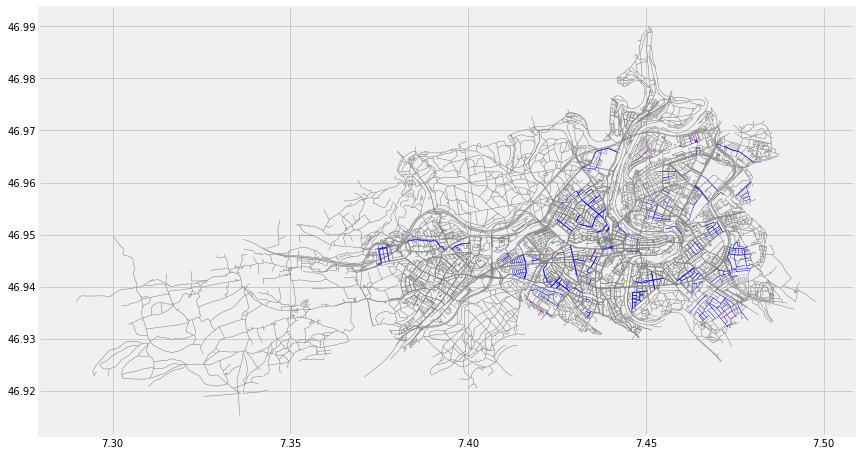

In [173]:
# Eine Karte wird geplottet. 
fig, ax=plt.subplots(figsize=[13,8])

gdf[gdf['gender'].isnull()].plot(ax=ax, color= 'grey', linewidth=0.5)
gdf[gdf['gender'] == 'M'].plot(ax=ax, color= 'blue', linewidth=0.5)
gdf[gdf['gender'] == 'F'].plot(ax=ax, color= 'purple', linewidth=0.5)

In [174]:
# ev. Export für Datawrapper. 
gdf_temp = gdf.copy()
gdf_temp = gdf_temp[['geometry', 'name', 'gender']]
gdf_temp = gdf_temp[gdf_temp['gender'] == 'F']
gdf_temp = gdf_temp.drop_duplicates(subset=['name'])

gdf_temp = gdf_temp.dropna(subset=['gender'])
gdf_temp = gpd.GeoDataFrame(gdf_temp)
gdf_temp['geometry'] = gdf_temp['geometry'].centroid

!rm export/marker.geojson
gdf_temp.to_file("export/marker.geojson", driver="GeoJSON")
!gedit export/marker.geojson

2021-05-20 11:55:45,343 [2324248] WARNING  py.warnings:109: [JupyterRequire] <ipython-input-174-8e98774e8369>:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_temp['geometry'] = gdf_temp['geometry'].centroid



## Auswertungen

In [177]:
# Wie viele Strassennamen gibt es in Bern? 
len(gdf[~gdf['name'].isnull()]['name'].unique())

972

In [183]:
# Wie viele Strassen konnten Männern oder Frauen zugeordnet werden? 
len(gdf[~gdf['gender'].isnull()]['wikidata'].unique())

164

In [186]:
# Wie viele Prozent der Stadtberner Strassen sind nach Menschen benannt? 
100 * len(gdf[~gdf['gender'].isnull()]['wikidata'].unique()) / len(gdf[~gdf['name'].isnull()]['name'].unique())

16.872427983539094

In [190]:
# Wie viele Prozent aller nach Menschen benannten Strassen sind nach Männern, wie viele nach Frauen benannt? 
df_temp = gdf.groupby(by='gender')['name'].nunique().to_frame()
df_temp.columns = ['anzahl']
df_temp['prozent'] = 100 * df_temp['anzahl'] / df_temp['anzahl'].sum()
df_temp

,anzahl,prozent
gender,,
+,2,1.190476
F,26,15.476190
M,140,83.333333


In [194]:
# Bei welchen sind beide Geschlechter vertreten? 
gdf[gdf['gender'] == '+'].drop_duplicates(subset=['wikidata'])

,highway,name,geometry,source,gender,wikidata
454,residential,Roschistrasse,"LINESTRING (7.43794 46.93535, 7.43799 46.93535...",wikidata,+,Q106676558;Q106676550
672,residential,Surbekstrasse,"LINESTRING (7.47461 46.94139, 7.47464 46.94138...",wikidata,+,Q1895470;Q2522597


In [208]:
# Welche Strassenkategorien kriegen die Frauen, welche die Männer? 
df_temp = gdf.drop_duplicates(subset=['name']).groupby(by=['highway', 'gender'])[['name']].count().sort_values(by='name', ascending=False).unstack()
df_temp.columns = [x[1] for x in df_temp.columns]
df_temp = df_temp[['F', 'M']]

# Da die Kategorien zu detailliert sind, werden ähnliche Strassentypen zusammengefasst. 
kats = {'Strassen': ['primary', 'secondary'], 
        'Wohnstrassen': ['residential', 'living_street'],
        'Klein- und Verbindungsstrassen': ['tertiary', 'service', 'unclassified'], 
        'Fussgängerwege': ['pedestrian', 'footway']}

df_kat = pd.DataFrame(kats.keys()).set_index(0, drop=True)
for k in kats: 
    df_kat.at[k, 'F'] = df_temp.loc[kats[k]]['F'].sum()
    df_kat.at[k, 'M'] = df_temp.loc[kats[k]]['M'].sum()
    
# Die relativen Zahlen werden berechnet. 
df_kat['f_rel'] = 100 * df_kat['F'] / df_kat['F'].sum()
df_kat['m_rel'] = 100 * df_kat['M'] / df_kat['M'].sum()

df_kat.index = df_kat.index.rename('')
df_kat

,F,M,f_rel,m_rel
,,,,
Strassen,0.0,3.0,0.000000,2.142857
Wohnstrassen,15.0,118.0,57.692308,84.285714
Klein- und Verbindungsstrassen,4.0,15.0,15.384615,10.714286
Fussgängerwege,7.0,4.0,26.923077,2.857143


In [210]:
# Datawrapper-Export.
dw_id = 'MCiJ5'

# Die Daten werden aktualisiert. 
dw.add_data(chart_id=dw_id, data=df_kat[['F', 'M']].reset_index())

# Die Grafk wird publiziert. 
dw.publish_chart(chart_id=dw_id)

In [267]:
'''# Wie lange sind die den Männern und den Frauen gewidmeten Strassen? 
(Achtung: Für diverse Strassen sind mehrere Linien erfasst. Sie müssten für den Vergleich rausgerechnet werden...)

# Gearbeitet wird ausschliesslich mit den Strassen (bzw. mit Linien statt mit Flächen). 
gdf_temp = gdf.copy()
gdf_temp = gdf_temp[~gdf_temp['gender'].isnull()]
gdf_temp['typ'] = gdf_temp['geometry'].apply(lambda x: str(type(x)))
gdf_temp = gdf_temp[gdf_temp['typ'].str.contains('LineString')]

def massstab(geom):
    my_transformer = Transformer.from_crs('EPSG:4326', 'EPSG:3857', always_xy=True)
    geom_transformed = sp_ops.transform(my_transformer.transform, geom)
    return geom_transformed.length

gdf_temp['länge'] = gdf_temp['geometry'].apply(massstab)

# Die Länge der Teilstrecken für die Männer und die Frauen wird aufsummiert. 
#gdf_temp = gdf_temp.groupby(by='gender')['länge'].sum().to_frame()
gdf_temp'''

"# Wie lange sind die den Männern und den Frauen gewidmeten Strassen? (Achtung: Für diverse Strassen sind mehrere Linien erfasst.   \n# einzelne Fahrspuren erfasst? Dann müssten sie für den Vergleich rausgerechnet werden...)\n\n# Gearbeitet wird ausschliesslich mit den Strassen (bzw. mit Linien statt mit Flächen). \ngdf_temp = gdf.copy()\ngdf_temp = gdf_temp[~gdf_temp['gender'].isnull()]\ngdf_temp['typ'] = gdf_temp['geometry'].apply(lambda x: str(type(x)))\ngdf_temp = gdf_temp[gdf_temp['typ'].str.contains('LineString')]\n\ndef massstab(geom):\n    my_transformer = Transformer.from_crs('EPSG:4326', 'EPSG:3857', always_xy=True)\n    geom_transformed = sp_ops.transform(my_transformer.transform, geom)\n    return geom_transformed.length\n\ngdf_temp['länge'] = gdf_temp['geometry'].apply(massstab)\n\n# Die Länge der Teilstrecken für die Männer und die Frauen wird aufsummiert. \n#gdf_temp = gdf_temp.groupby(by='gender')['länge'].sum().to_frame()\ngdf_temp"